# NS-Forest workflow

In [2]:
import sys
import os
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
CODE_PATH = "/Users/adeslatt/Scitechcon Dropbox/Anne DeslattesMays/projects/NSForest" # location of NSForest folder
sys.path.insert(0, os.path.abspath(CODE_PATH))
from nsforest import ns, nsforesting, utils, NSFOREST_VERSION

In [3]:
pd.set_option('display.max_rows', None)

## 0. Set up

In [4]:
## set up
organ = "kidney" #<---
author = "Lake" #<---
year = "2023" #<---
output_folder = "outputs_" + organ + "_" + author + "_" + year + "/" #e.g., "outputs_kidney_Lake_2023/"

cluster_header = "subclass.full" #<---
outputfilename_suffix = cluster_header
outputfilename_prefix = cluster_header 

## 1. Data

#### [need to filter normal cells -- Anne]

In [5]:
data_folder = "/Users/adeslatt/Scitechcon Dropbox/Anne DeslattesMays/projects/nsforest-nf/data/" #<---

In [6]:
adata = sc.read_h5ad(data_folder + "adata_normal_n3566.h5ad") #<---

In [7]:
adata

AnnData object with n_obs × n_vars = 3566 × 33826
    obs: 'nCount_RNA', 'nFeature_RNA', 'library', 'percent.er', 'percent.mt', 'degen.score', 'aEpi.score', 'aStr.score', 'cyc.score', 'matrisome.score', 'collagen.score', 'glycoprotein.score', 'proteoglycan.score', 'S.Score', 'G2M.Score', 'experiment', 'specimen', 'condition.long', 'condition.l1', 'condition.l2', 'donor_id', 'region.l1', 'region.l2', 'percent.cortex', 'percent.medulla', 'sample_tissue_type', 'id', 'pagoda_k100_infomap_coembed', 'subclass.full', 'subclass.l3', 'subclass.l2', 'subclass.l1', 'state.l2', 'state', 'class', 'structure', 'disease_ontology_term_id', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'eGFR', 'BMI', 'diabetes_history', 'hypertension', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'is_primary_data', 'suspension_type', 'tissue_type', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity'

## 2. Clusters

#### number of clusters

In [8]:
## number of clusters
n_clusters = adata.obs[cluster_header].nunique()
n_clusters

75

#### dendrogram (run this to automatically create the output folder)

In [9]:
## auto-adjust figsize
fig_width = int(n_clusters/5)
fig_height = max([2, int(max([len(z) for z in adata.obs[cluster_header].unique()]) / 30) + 1])

/Users/adeslatt/miniforge3/envs/springer-verlag/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 33826 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


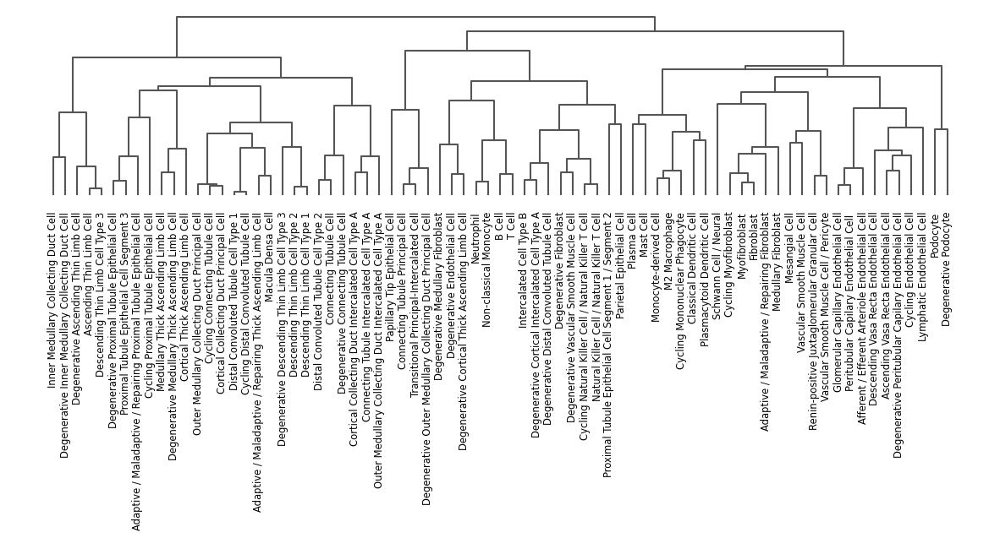

In [10]:
## dendrogram and save svg
ns.pp.dendrogram(adata, cluster_header, figsize = (fig_width, fig_height), tl_kwargs = {'optimal_ordering': True},
                 save = "svg", output_folder = output_folder, outputfilename_suffix = outputfilename_suffix)

#### cluster sizes

In [11]:
## cluster sizes
df_cluster_sizes = pd.DataFrame(adata.obs[cluster_header].value_counts())
df_cluster_sizes

,count
subclass.full,
Adaptive / Maladaptive / Repairing Fibroblast,50
Adaptive / Maladaptive / Repairing Proximal Tubule Epithelial Cell,50
Mesangial Cell,50
Medullary Thick Ascending Limb Cell,50
Medullary Fibroblast,50
Mast Cell,50
Macula Densa Cell,50
M2 Macrophage,50
Lymphatic Endothelial Cell,50


In [12]:
## save
df_cluster_sizes.to_csv(output_folder + outputfilename_prefix + "_cluster_sizes.csv")

#### cluster order

In [13]:
cluster_order = [x.strip() for x in adata.uns["dendrogram_" + cluster_header]['categories_ordered']]

In [14]:
## save
pd.DataFrame({'cluster_order': cluster_order}).to_csv(output_folder + outputfilename_prefix + "_cluster_order.csv", index=False)

#### summary statistics of data (normal cells)

In [15]:
df_normal = pd.DataFrame({'n_obs': [adata.n_obs], 'n_vars': [adata.n_vars], 'n_clusters': [n_clusters]})
df_normal

,n_obs,n_vars,n_clusters
0,3566,33826,75


In [16]:
## save
df_normal.to_csv(output_folder + outputfilename_prefix + "_summary_normal.csv", index=False)

## 3. NS-Forest 

#### prep

In [17]:
## make a copy b/c the median step will only keep the positive genes
## keep the original data for plotting
adata_prep = adata.copy()

In [18]:
## get medians
adata_prep = ns.pp.prep_medians(adata_prep, cluster_header)

Calculating medians...


Calculating medians (means) per cluster: 100%|███████████████████████████████████████████████████| 75/75 [00:02<00:00, 27.05it/s]


Saving calculated medians as adata.varm.medians_subclass.full
--- 2.796705961227417 seconds ---
median: 0.0
mean: 0.021279227
std: 0.18309134
Only positive genes selected. 5607 positive genes out of 33826 total genes


In [19]:
## get binary scores
adata_prep = ns.pp.prep_binary_scores(adata_prep, cluster_header)

Calculating binary scores...


Calculating binary scores per cluster: 100%|█████████████████████████████████████████████████████| 75/75 [00:21<00:00,  3.50it/s]

Saving calculated binary scores as adata.varm.binary_scores_subclass.full
--- 21.49819588661194 seconds ---
median: 0.0
mean: 0.0833122006411828
std: 0.2459721379945466


In [20]:
## check medians
df_medians = adata_prep.varm['medians_' + cluster_header]
print(df_medians.shape)
df_medians.head()

(5607, 75)


,Adaptive / Maladaptive / Repairing Fibroblast,Adaptive / Maladaptive / Repairing Proximal Tubule Epithelial Cell,Adaptive / Maladaptive / Repairing Thick Ascending Limb Cell,Afferent / Efferent Arteriole Endothelial Cell,Ascending Thin Limb Cell,Ascending Vasa Recta Endothelial Cell,B Cell,Classical Dendritic Cell,Connecting Tubule Cell,Connecting Tubule Intercalated Cell Type A,...,Plasmacytoid Dendritic Cell,Podocyte,Proximal Tubule Epithelial Cell Segment 1 / Segment 2,Proximal Tubule Epithelial Cell Segment 3,Renin-positive Juxtaglomerular Granular Cell,Schwann Cell / Neural,T Cell,Transitional Principal-Intercalated Cell,Vascular Smooth Muscle Cell,Vascular Smooth Muscle Cell / Pericyte
ENSG00000175899,0.0,0.000000,0.000000,2.1501,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.985069,0.0,0.000000,0.000000,0.0,1.36513
ENSG00000128274,0.0,0.000000,0.000000,0.0000,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000
ENSG00000103591,0.0,0.000000,0.000000,0.0000,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000
ENSG00000115977,0.0,1.092519,1.096968,0.0000,1.399926,0.0,0.0,0.0,1.269087,1.171837,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.595464,0.931235,0.0,0.00000
ENSG00000157426,0.0,0.000000,0.000000,0.0000,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000


In [21]:
## check binary scores
df_binary_scores = adata_prep.varm['binary_scores_' + cluster_header]
print(df_binary_scores.shape)
df_binary_scores.head()

(5607, 75)


,Adaptive / Maladaptive / Repairing Fibroblast,Adaptive / Maladaptive / Repairing Proximal Tubule Epithelial Cell,Adaptive / Maladaptive / Repairing Thick Ascending Limb Cell,Afferent / Efferent Arteriole Endothelial Cell,Ascending Thin Limb Cell,Ascending Vasa Recta Endothelial Cell,B Cell,Classical Dendritic Cell,Connecting Tubule Cell,Connecting Tubule Intercalated Cell Type A,...,Plasmacytoid Dendritic Cell,Podocyte,Proximal Tubule Epithelial Cell Segment 1 / Segment 2,Proximal Tubule Epithelial Cell Segment 3,Renin-positive Juxtaglomerular Granular Cell,Schwann Cell / Neural,T Cell,Transitional Principal-Intercalated Cell,Vascular Smooth Muscle Cell,Vascular Smooth Muscle Cell / Pericyte
ENSG00000175899,0.0,0.000000,0.000000,0.936407,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.894096,0.0,0.000000,0.000000,0.0,0.902851
ENSG00000128274,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000
ENSG00000103591,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000
ENSG00000115977,0.0,0.629325,0.629896,0.000000,0.674722,0.0,0.0,0.0,0.654184,0.639728,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.597169,0.615731,0.0,0.000000
ENSG00000157426,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000


In [22]:
## save csv and pkl
df_medians.to_csv(output_folder + outputfilename_prefix + "_medians.csv")
df_medians.to_pickle(output_folder + outputfilename_prefix + "_medians.pkl")

df_binary_scores.to_csv(output_folder + outputfilename_prefix + "_binary_scores.csv")
df_binary_scores.to_pickle(output_folder + outputfilename_prefix + "_binary_scores.pkl")

#### histograms of  non-zero  values [TO-DO: nice to have them as functions -- Beverly]

In [23]:
non_zero_medians = df_medians[df_medians != 0].stack().values

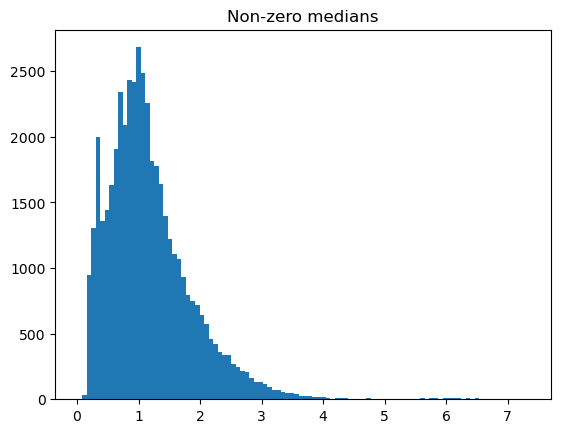

In [24]:
plt.hist(non_zero_medians, bins=100)
plt.title("Non-zero medians")

plt.savefig(output_folder + "hist_nonzero_medians_" + outputfilename_suffix + ".svg")
plt.show()

In [25]:
non_zero_binary_scores = df_binary_scores[df_binary_scores != 0].stack().values

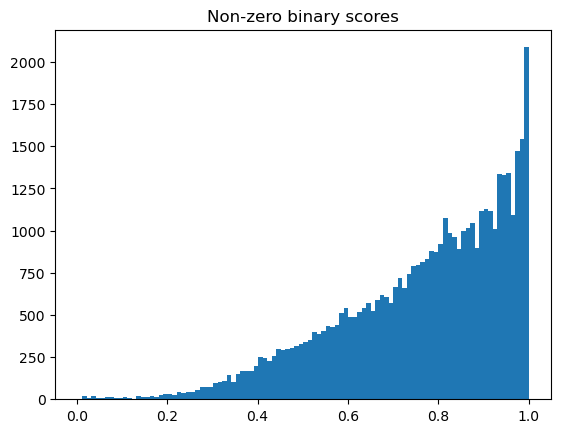

In [26]:
plt.hist(non_zero_binary_scores, bins=100)
plt.title("Non-zero binary scores")

plt.savefig(output_folder + "hist_nonzero_binary_scores_" + outputfilename_suffix + ".svg")
plt.show()

#### run `NSForest()`

In [27]:
results = nsforesting.NSForest(adata_prep, cluster_header, save = True, save_supplementary = True,
                               output_folder = output_folder, outputfilename_prefix = outputfilename_prefix)

Running NS-Forest version 4.1
Preparing adata...
--- 0.025889873504638672 seconds ---
Pre-selecting genes based on binary scores...
	BinaryFirst_high Threshold (mean + 2 * std): 0.575256476630276
	Average number of genes after gene_selection in each cluster: 505.8933333333333
Saving number of genes selected per cluster as...
outputs_kidney_Lake_2023/subclass.full_gene_selection.csv
Number of clusters to evaluate: 75
1 out of 75:
	Adaptive / Maladaptive / Repairing Fibroblast
	Pre-selected 293 genes to feed into Random Forest.
	  NSForest-selected markers: ['ENSG00000156218', 'ENSG00000077942', 'ENSG00000185070']
	  fbeta: 0.561
	  precision: 0.917
	  recall: 0.22
2 out of 75:
	Adaptive / Maladaptive / Repairing Proximal Tubule Epithelial Cell
	Pre-selected 786 genes to feed into Random Forest.
	  NSForest-selected markers: ['ENSG00000135220', 'ENSG00000170579']
	  fbeta: 0.634
	  precision: 0.783
	  recall: 0.36
3 out of 75:
	Adaptive / Maladaptive / Repairing Thick Ascending Limb Cell

Calculating medians (means) per cluster: 100%|██████████████████████████████████████████████████| 75/75 [00:00<00:00, 146.31it/s]

Saving supplementary table as...
outputs_kidney_Lake_2023/subclass.full_markers_onTarget_supp.csv
Saving supplementary table as...
outputs_kidney_Lake_2023/subclass.full_markers_onTarget.csv
Saving final results table as...
outputs_kidney_Lake_2023/subclass.full_results.csv
Saving final results table as...
outputs_kidney_Lake_2023/subclass.full_results.pkl
--- 121.67501425743103 seconds ---


In [28]:
results

,software_version,cluster_header,clusterName,clusterSize,f_score,precision,recall,TN,FP,FN,TP,marker_count,NSForest_markers,binary_genes,onTarget
0,4.1,subclass.full,Adaptive / Maladaptive / Repairing Fibroblast,50,0.561224,0.916667,0.220000,3515,1,39,11,3,"[ENSG00000156218, ENSG00000077942, ENSG0000018...","[ENSG00000091986, ENSG00000156218, ENSG0000007...",0.427534
1,4.1,subclass.full,Adaptive / Maladaptive / Repairing Proximal Tu...,50,0.633803,0.782609,0.360000,3511,5,32,18,2,"[ENSG00000135220, ENSG00000170579]","[ENSG00000135220, ENSG00000146592, ENSG0000017...",0.706288
2,4.1,subclass.full,Adaptive / Maladaptive / Repairing Thick Ascen...,50,0.615942,0.772727,0.340000,3511,5,33,17,3,"[ENSG00000129682, ENSG00000115221, ENSG0000012...","[ENSG00000152056, ENSG00000129682, ENSG0000011...",0.273096
3,4.1,subclass.full,Afferent / Efferent Arteriole Endothelial Cell,50,0.760870,0.954545,0.420000,3515,1,29,21,2,"[ENSG00000135919, ENSG00000131477]","[ENSG00000135919, ENSG00000090006, ENSG0000016...",0.778972
4,4.1,subclass.full,Ascending Thin Limb Cell,50,0.615942,0.772727,0.340000,3511,5,33,17,2,"[ENSG00000184374, ENSG00000275395]","[ENSG00000184374, ENSG00000064787, ENSG0000008...",0.772847
5,4.1,subclass.full,Ascending Vasa Recta Endothelial Cell,50,0.730769,0.950000,0.380000,3515,1,31,19,2,"[ENSG00000148488, ENSG00000283632]","[ENSG00000249797, ENSG00000148488, ENSG0000015...",1.000000
6,4.1,subclass.full,B Cell,50,0.773196,0.833333,0.600000,3510,6,20,30,1,[ENSG00000156738],"[ENSG00000156738, ENSG00000153064, ENSG0000013...",1.000000
7,4.1,subclass.full,Classical Dendritic Cell,50,0.857143,0.900000,0.720000,3512,4,14,36,1,[ENSG00000131203],"[ENSG00000131203, ENSG00000140090, ENSG0000023...",1.000000
8,4.1,subclass.full,Connecting Tubule Cell,50,0.447761,0.571429,0.240000,3507,9,38,12,3,"[ENSG00000251504, ENSG00000165685, ENSG0000022...","[ENSG00000251504, ENSG00000104327, ENSG0000016...",0.118911
9,4.1,subclass.full,Connecting Tubule Intercalated Cell Type A,50,0.324675,0.384615,0.200000,3500,16,40,10,2,"[ENSG00000112530, ENSG00000145147]","[ENSG00000185274, ENSG00000154678, ENSG0000011...",0.240039


## 4. Plotting

#### **load NS-Forest results** (copy set up and load pkl)

In [29]:
# ## set up
# organ = "kidney" #<---
# author = "Lake" #<---
# year = "2023" #<---
# output_folder = "outputs_" + organ + "_" + author + "_" + year + "/" #e.g., "outputs_kidney_Lake_2023/"

# cluster_header = "subclass.full" #<---
# outputfilename_suffix = cluster_header
# outputfilename_prefix = cluster_header 

# ## load NS-Forest results
# results = pd.read_pickle(output_folder + cluster_header + "_results.pkl")

In [30]:
## set results to plot
results_to_plot = results

#### boxplots

Saving...
 outputs_kidney_Lake_2023/subclass.full_boxplot_f_score.html


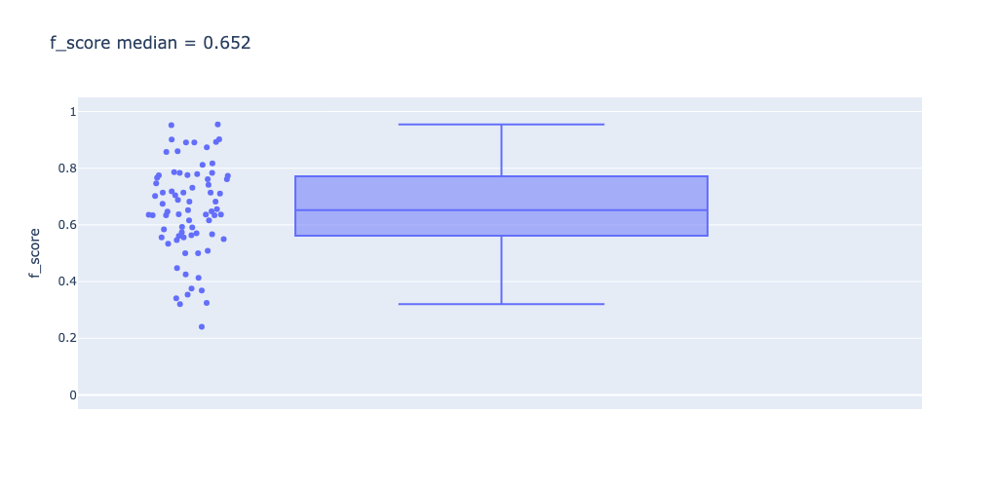

In [31]:
ns.pl.boxplot(results_to_plot, "f_score", save = "html", output_folder = output_folder, outputfilename_prefix = outputfilename_prefix)

Saving...
 outputs_kidney_Lake_2023/subclass.full_boxplot_precision.html


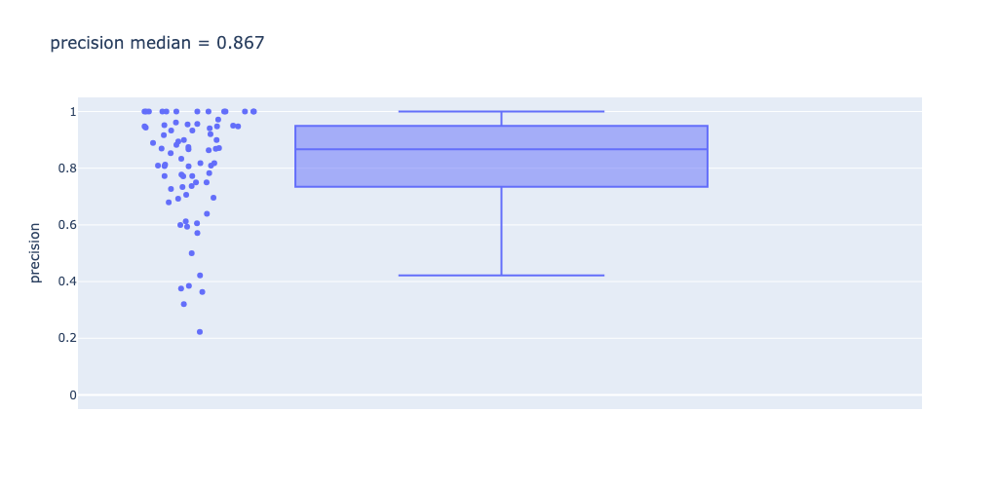

In [32]:
ns.pl.boxplot(results_to_plot, "precision", save = "html", output_folder = output_folder, outputfilename_prefix = outputfilename_prefix)

Saving...
 outputs_kidney_Lake_2023/subclass.full_boxplot_recall.html


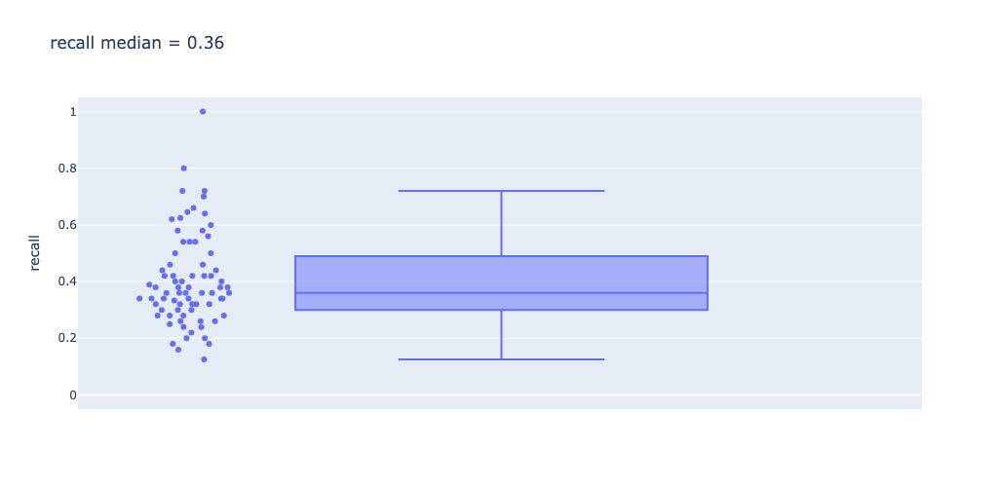

In [33]:
ns.pl.boxplot(results_to_plot, "recall", save = "html", output_folder = output_folder, outputfilename_prefix = outputfilename_prefix)

Saving...
 outputs_kidney_Lake_2023/subclass.full_boxplot_onTarget.html


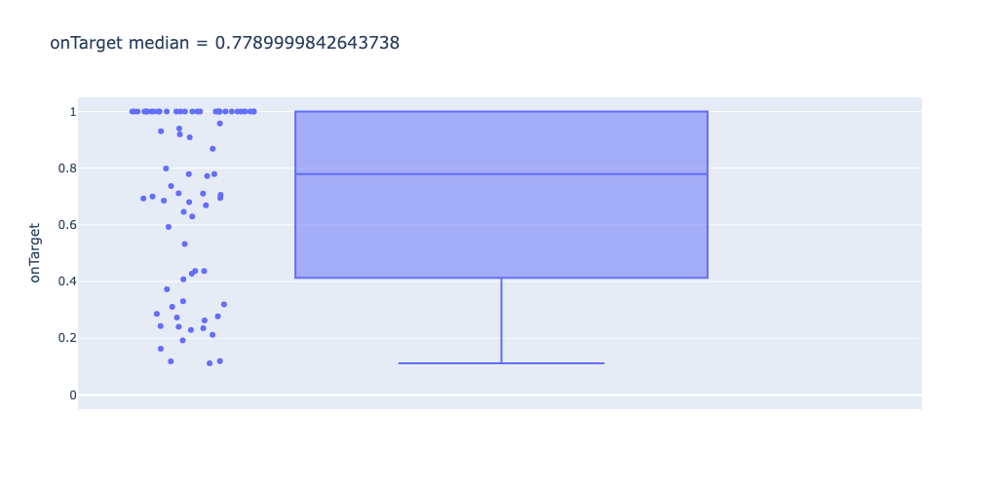

In [34]:
ns.pl.boxplot(results_to_plot, "onTarget", save = "html", output_folder = output_folder, outputfilename_prefix = outputfilename_prefix)

#### scatter plots w.r.t. cluster size

Saving...
 outputs_kidney_Lake_2023/subclass.full_scatter_f_score.html


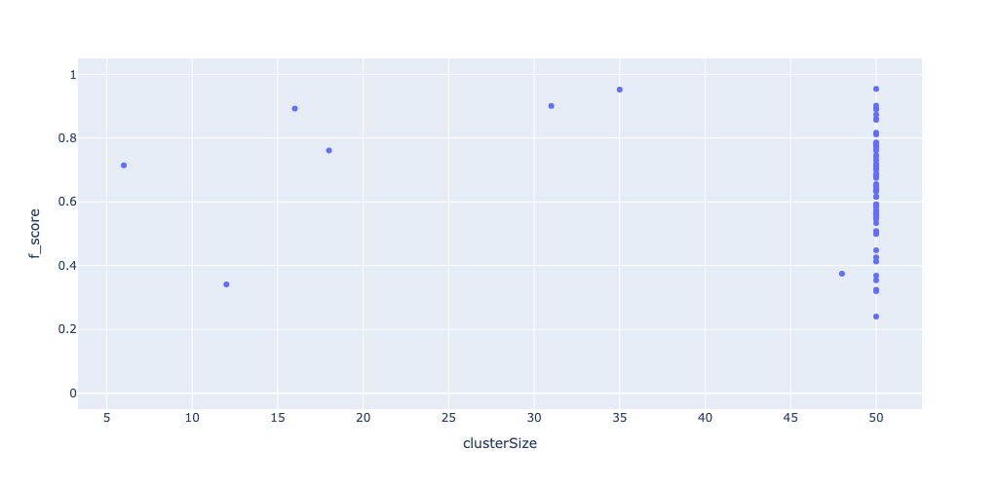

In [35]:
ns.pl.scatter_w_clusterSize(results, "f_score", save = True, output_folder = output_folder, outputfilename_prefix = outputfilename_prefix)

Saving...
 outputs_kidney_Lake_2023/subclass.full_scatter_precision.html


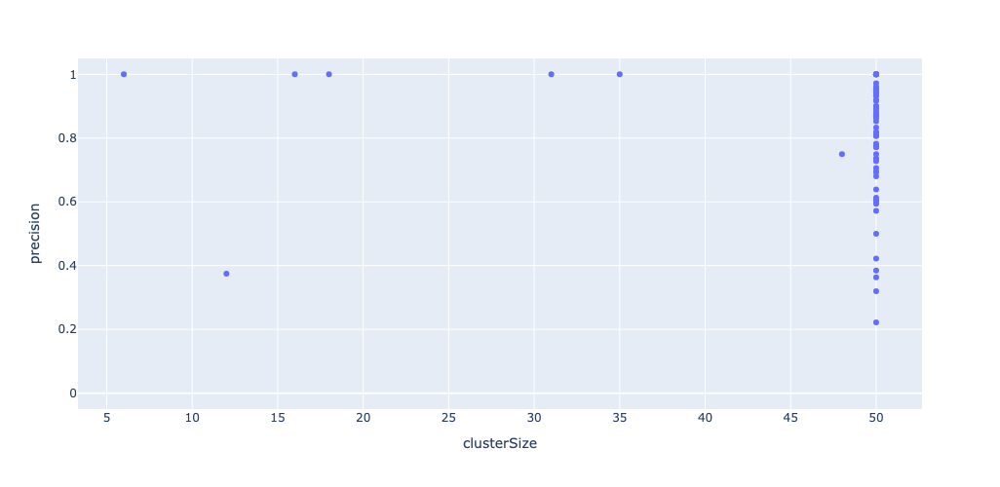

In [36]:
ns.pl.scatter_w_clusterSize(results, "precision", save = True, output_folder = output_folder, outputfilename_prefix = outputfilename_prefix)

Saving...
 outputs_kidney_Lake_2023/subclass.full_scatter_recall.html


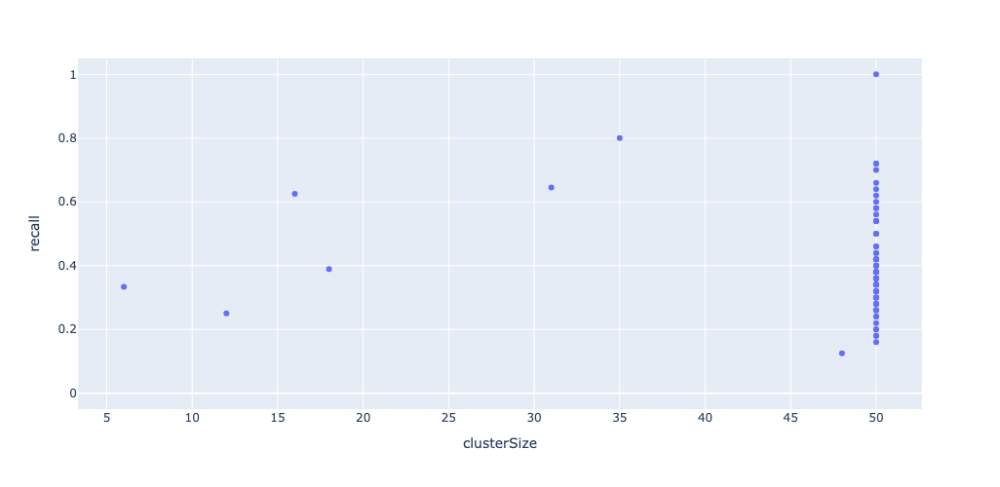

In [37]:
ns.pl.scatter_w_clusterSize(results, "recall", save = True, output_folder = output_folder, outputfilename_prefix = outputfilename_prefix)

Saving...
 outputs_kidney_Lake_2023/subclass.full_scatter_onTarget.html


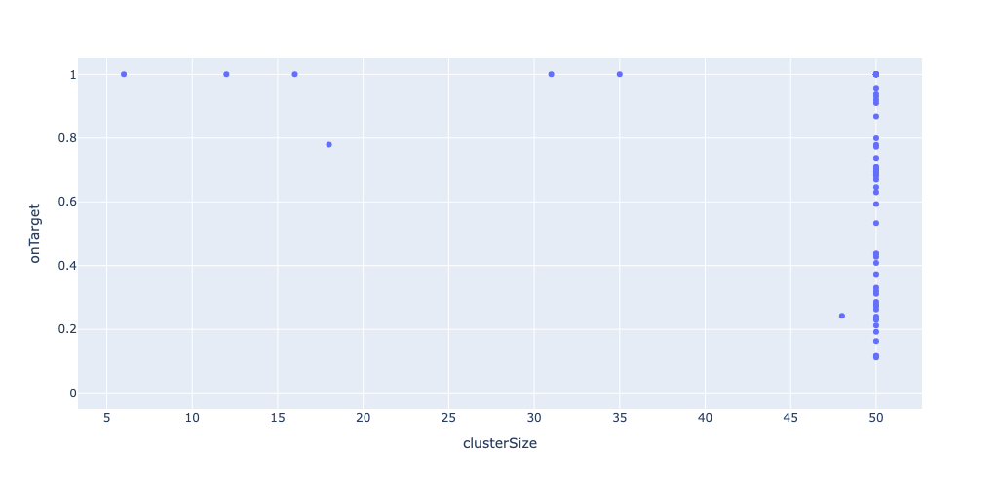

In [38]:
ns.pl.scatter_w_clusterSize(results, "onTarget", save = True, output_folder = output_folder, outputfilename_prefix = outputfilename_prefix)

#### scanpy plots [TO-DO: map ENSGs to gene symbols using Ray's repo -- Anne & Ray]

In [39]:
## make the markers dictionary for plotting
markers_dict = dict(zip(results_to_plot["clusterName"], results_to_plot["NSForest_markers"]))

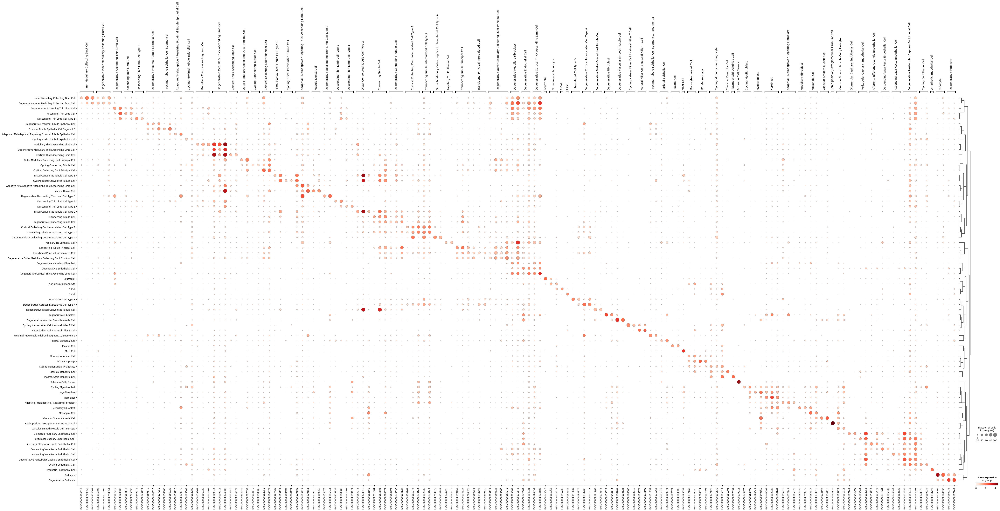

In [40]:
ns.pl.dotplot(adata, markers_dict, cluster_header, dendrogram = True, use_raw = False,
              save = "svg", output_folder = output_folder, outputfilename_suffix = outputfilename_prefix)

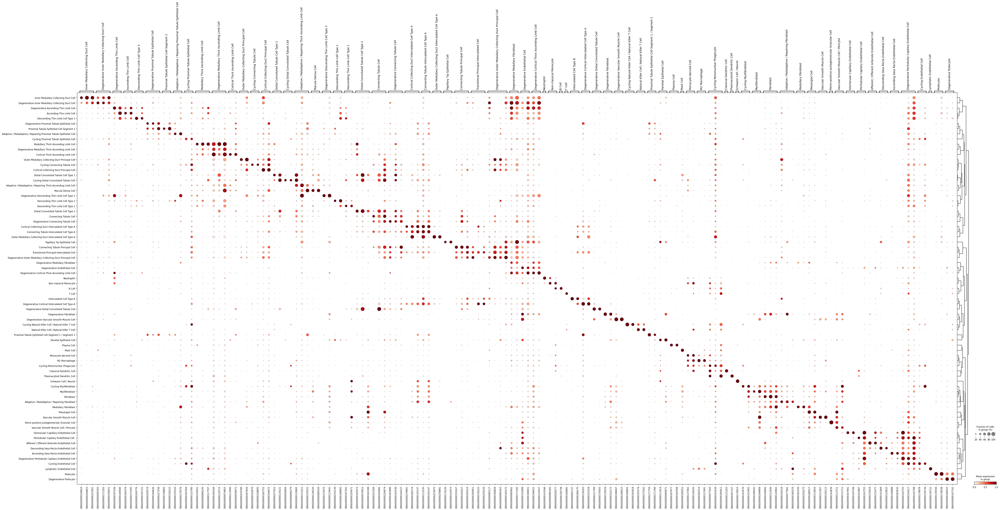

In [41]:
ns.pl.dotplot(adata, markers_dict, cluster_header, dendrogram = True, use_raw = False, standard_scale = 'var', 
              save = "svg", output_folder = output_folder, outputfilename_suffix = outputfilename_prefix + "_scaled")

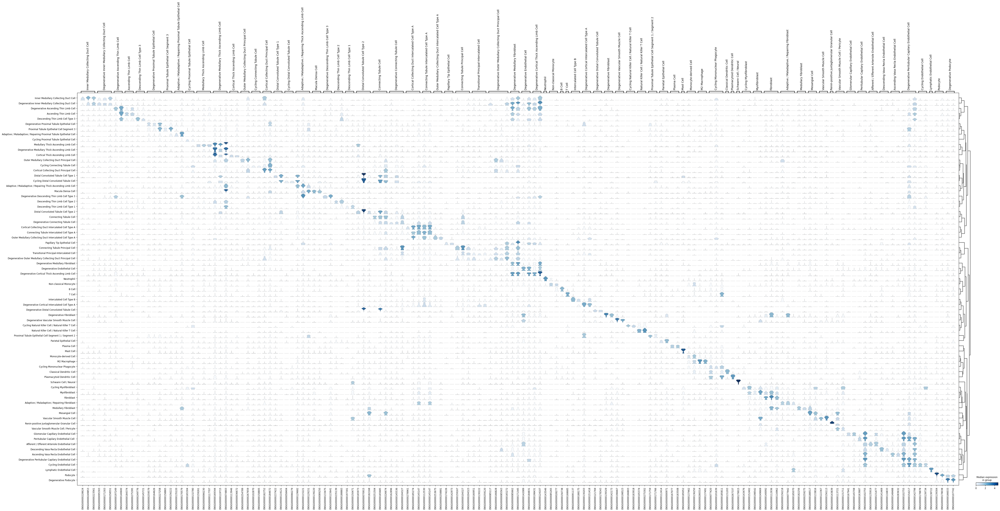

In [42]:
ns.pl.stackedviolin(adata, markers_dict, cluster_header, dendrogram = True, use_raw = False,
                    save = "svg", output_folder = output_folder, outputfilename_suffix = outputfilename_prefix)

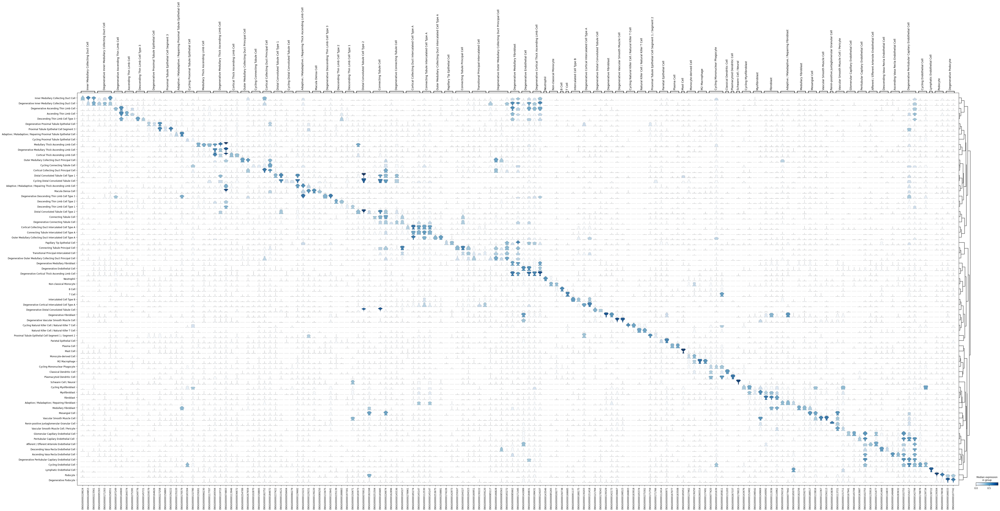

In [43]:
ns.pl.stackedviolin(adata, markers_dict, cluster_header, dendrogram = True, use_raw = False, standard_scale = 'var',
                    save = "svg", output_folder = output_folder, outputfilename_suffix = outputfilename_prefix + "_scaled")

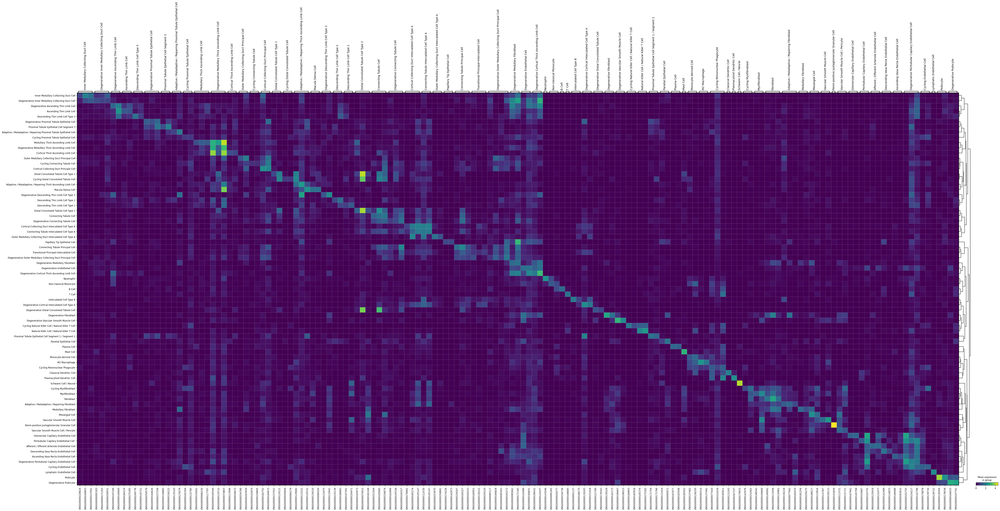

In [44]:
ns.pl.matrixplot(adata, markers_dict, cluster_header, dendrogram = True, use_raw = False,
                 save = "svg", output_folder = output_folder, outputfilename_suffix = outputfilename_prefix)

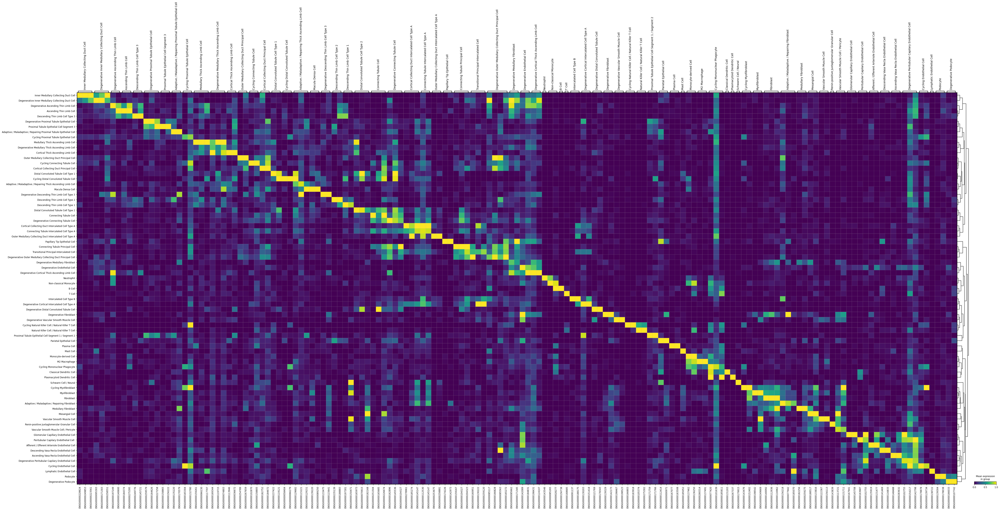

In [45]:
ns.pl.matrixplot(adata, markers_dict, cluster_header, dendrogram = True, use_raw = False, standard_scale = 'var',
                 save = "svg", output_folder = output_folder, outputfilename_suffix = outputfilename_prefix + "_scaled")

# Save

#### count saved items in the output folder

In [46]:
from pathlib import Path
folder_path = Path(output_folder) 
item_count = len(list(folder_path.iterdir()))
print(f"Total items in the output folder: {item_count}")

Total items in the output folder: 31


#### saving html report

In [47]:
## for interactive plot
import plotly
plotly.offline.init_notebook_mode()

In [48]:
## save html report
!jupyter nbconvert --to html DEMO_NS-Forest_workflow.ipynb #<---

[NbConvertApp] WARNING | pattern 'DEMO_NS-Forest_workflow.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes=True]
-